# Loading the libraries we want that are numpy, scipy and matplotlib

In [7]:
%matplotlib inline
import numpy as np
from scipy import misc
import imageio
import matplotlib.pyplot as plt

## Creating a numpy from image file

In [14]:
from skimage import data
photo_data = np.array(imageio.imread('./wifire/sd-3layers.jpg'))
type(photo_data)

numpy.ndarray

## Lets see what the image is

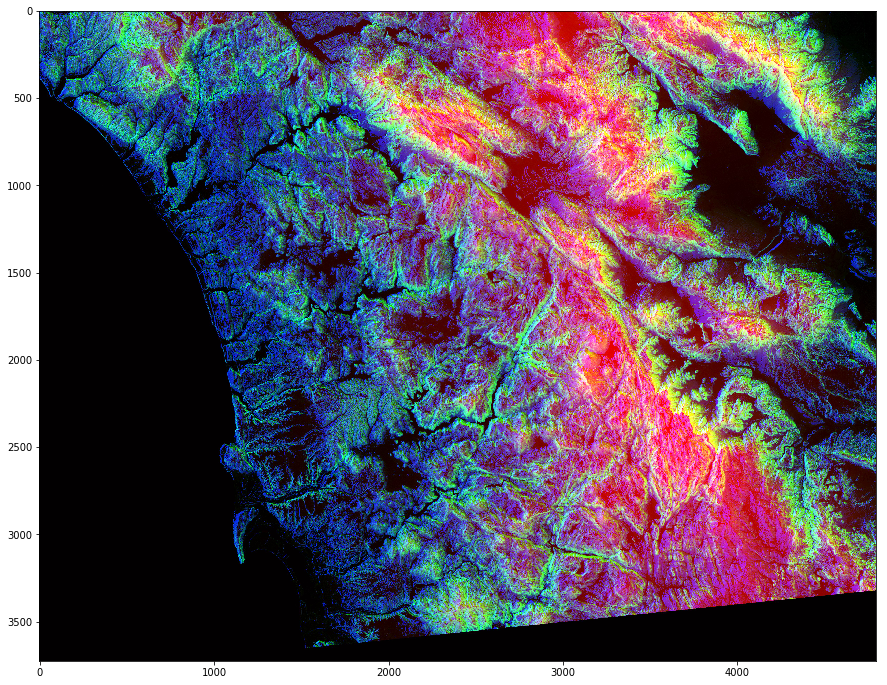

In [15]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [17]:
photo_data.shape

(3725, 4797, 3)

In [18]:
photo_data.size

53606475

In [20]:
photo_data.min(), photo_data.max()

(0, 255)

In [21]:
photo_data.mean()

75.8299354508947

## Pixel on the 150th row and 250th column

In [22]:
photo_data[150, 250]

array([ 17,  35, 255], dtype=uint8)

In [23]:
photo_data[150, 250, 1]

35

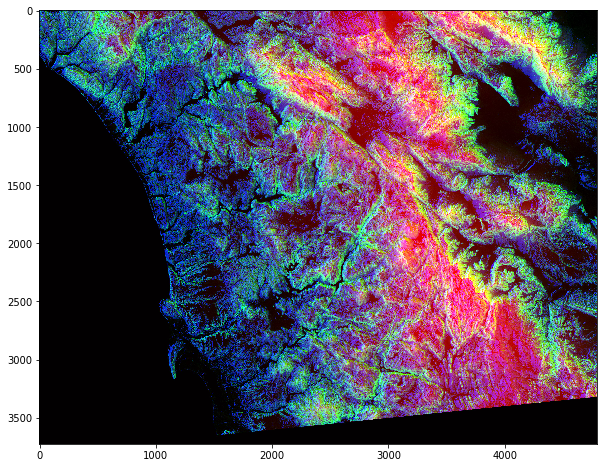

In [29]:
# photo_data = np.array(imageio.imread('./wifire/sd-3layers.jpg'))
photo_data[150, 250] = 0
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

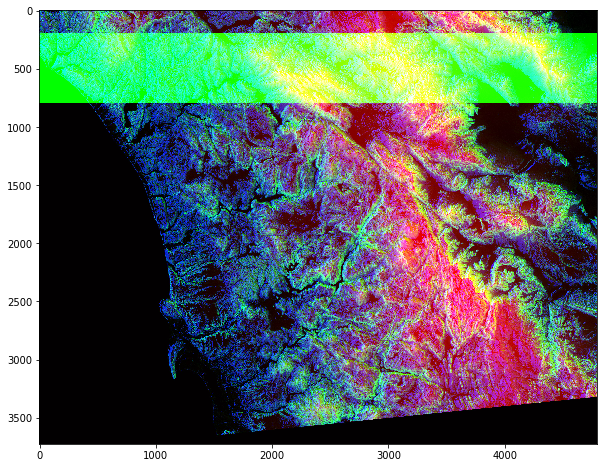

In [31]:
photo_data = np.array(imageio.imread('./wifire/sd-3layers.jpg'))

photo_data[200:800, :, 1] = 255
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

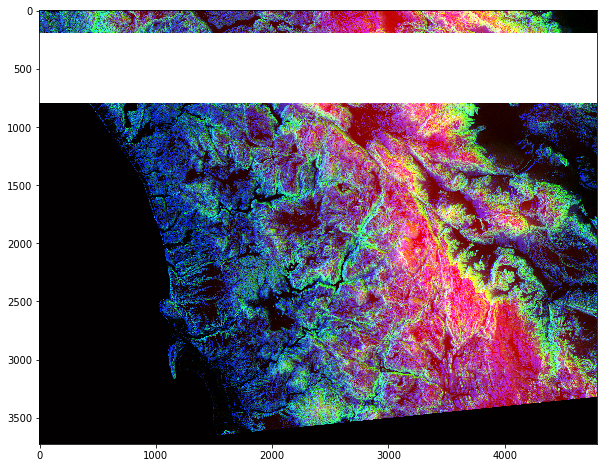

In [32]:
photo_data = np.array(imageio.imread('./wifire/sd-3layers.jpg'))

photo_data[200:800, :] = 255
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

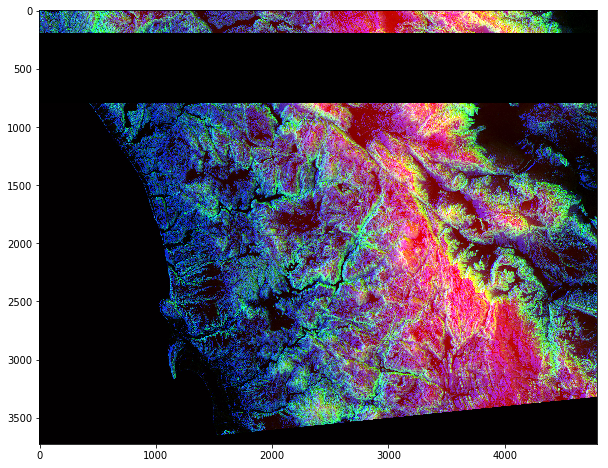

In [33]:
photo_data = np.array(imageio.imread('./wifire/sd-3layers.jpg'))
photo_data[200:800, :] = 0
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

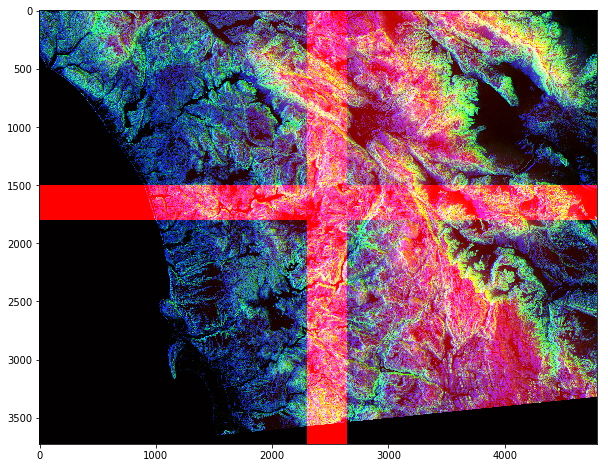

In [42]:
photo_data = np.array(imageio.imread('./wifire/sd-3layers.jpg'))

photo_data[1500:1800, :, 0] = 255
photo_data[:, 2300:2650, 0] = 255
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

## Pick all pixels with low value

In [49]:
photo_data = np.array(imageio.imread('./wifire/sd-3layers.jpg'))
print("Shape of the photo_data: \t", photo_data.shape)
low_value_filter = photo_data < 200
print("Shape of the low_value_filter: \t", low_value_filter.shape)

Shape of the photo_data: 	 (3725, 4797, 3)
Shape of the low_value_filter: 	 (3725, 4797, 3)


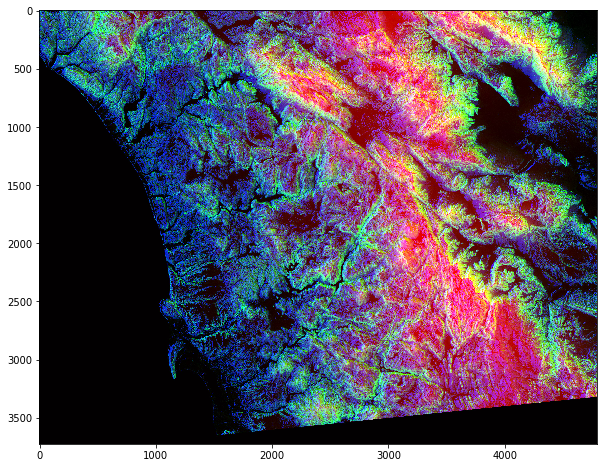

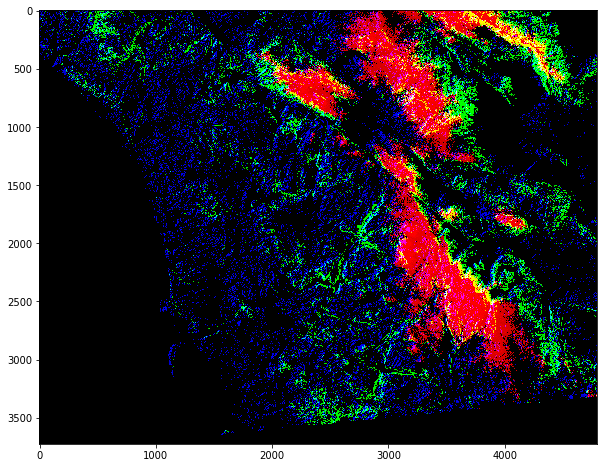

In [50]:
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)
photo_data[low_value_filter] = 0
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

In [64]:
photo_data = np.array(imageio.imread('./wifire/sd-3layers.jpg'))
rows_range = np.arange(len(photo_data))
cols_range = rows_range
print(type(cols_range))
print(cols_range.shape)

<class 'numpy.ndarray'>
(3725,)


In [65]:
photo_data[rows_range, cols_range] = 255

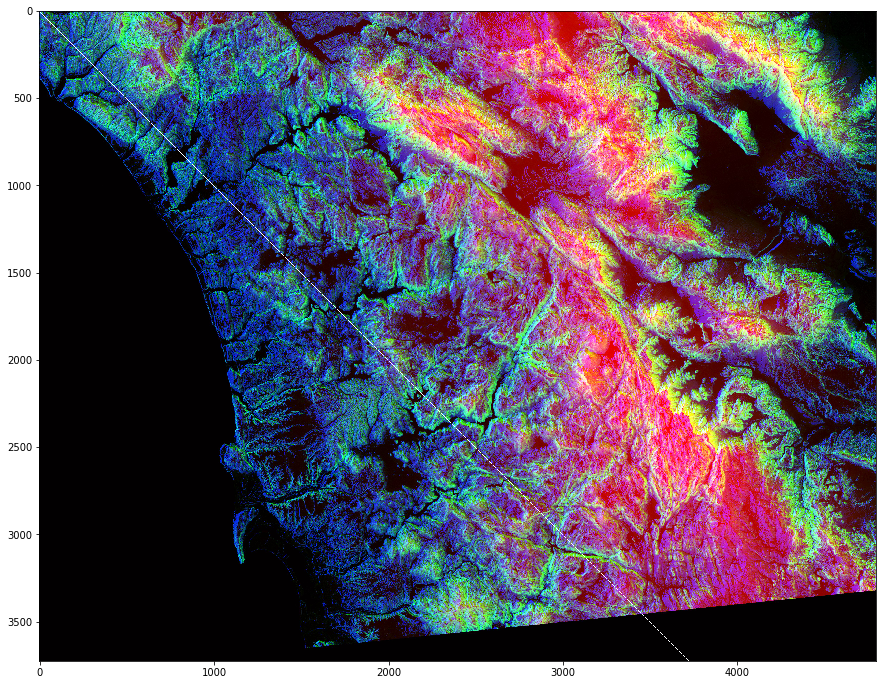

In [67]:
plt.figure(figsize=(15, 15))
plt.imshow(photo_data)

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import imageio

In [15]:
photo_data = np.array(imageio.imread('./wifire/sd-3layers.jpg'))
total_rows, total_cols, total_layers = photo_data.shape

# print("SHape of photo", photo_data.shape)

x, y = np.ogrid[:total_rows, :total_cols]

print("X shape", x.shape, "Y shape", y.shape)
# print(x)

X shape (3725, 1) Y shape (1, 4797)


In [24]:
centre_row, centre_col = total_rows/2, total_cols/2
print("Centre row", centre_row, "Centre Col", centre_col)

# Distance from the center ask the question in discussion form
dist_from_center = (x-centre_row)**2 + (y-centre_col)**2
print("Distance from the center", dist_from_center)

radius = centre_row ** 2
print("Radius: ", radius)
circular_mask = dist_from_center > radius
print("Circular_mask", circular_mask)
print("Circular_mask", circular_mask[1500:1700, 2000:2200])


Centre row 1862.5 Centre Col 2398.5
Distance from the center [[9221708.5 9216912.5 9212118.5 ... 9207326.5 9212118.5 9216912.5]
 [9217984.5 9213188.5 9208394.5 ... 9203602.5 9208394.5 9213188.5]
 [9214262.5 9209466.5 9204672.5 ... 9199880.5 9204672.5 9209466.5]
 ...
 [9210542.5 9205746.5 9200952.5 ... 9196160.5 9200952.5 9205746.5]
 [9214262.5 9209466.5 9204672.5 ... 9199880.5 9204672.5 9209466.5]
 [9217984.5 9213188.5 9208394.5 ... 9203602.5 9208394.5 9213188.5]]
Radius:  3468906.25
Circular_mask [[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
Circular_mask [[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]

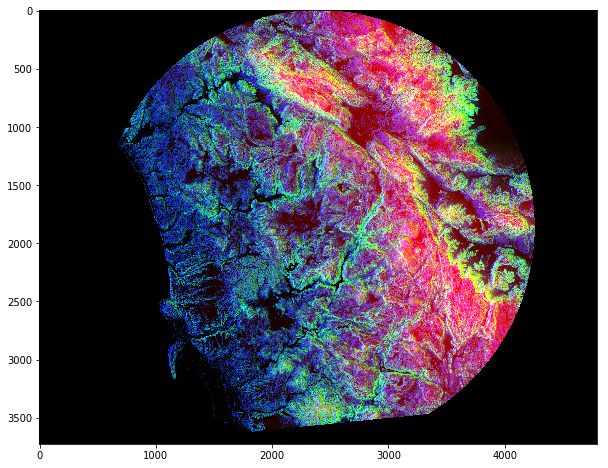

In [26]:
photo_data[circular_mask] = 0
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

In [30]:
X, Y = np.ogrid[:total_rows, :total_cols]
half_upper = X < centre_row

half_upper_mask = np.logical_and(circular_mask, half_upper)

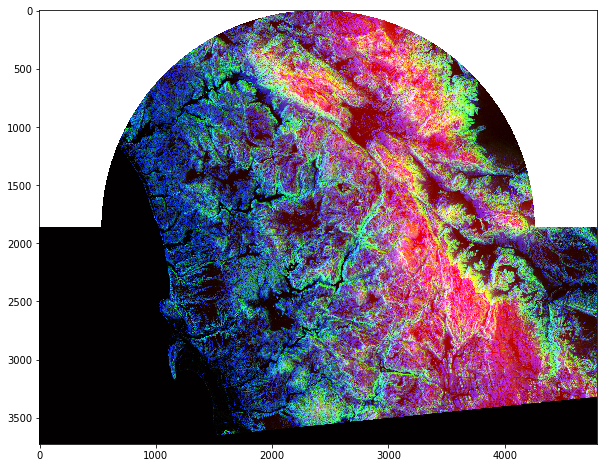

In [36]:
photo_data = np.array(imageio.imread('./wifire/sd-3layers.jpg'))

photo_data[half_upper_mask] = 255
# photo_data[half_upper_mask] = np.random.randint(200, 255)
plt.figure(figsize=(10, 10))
plt.imshow(photo_data)

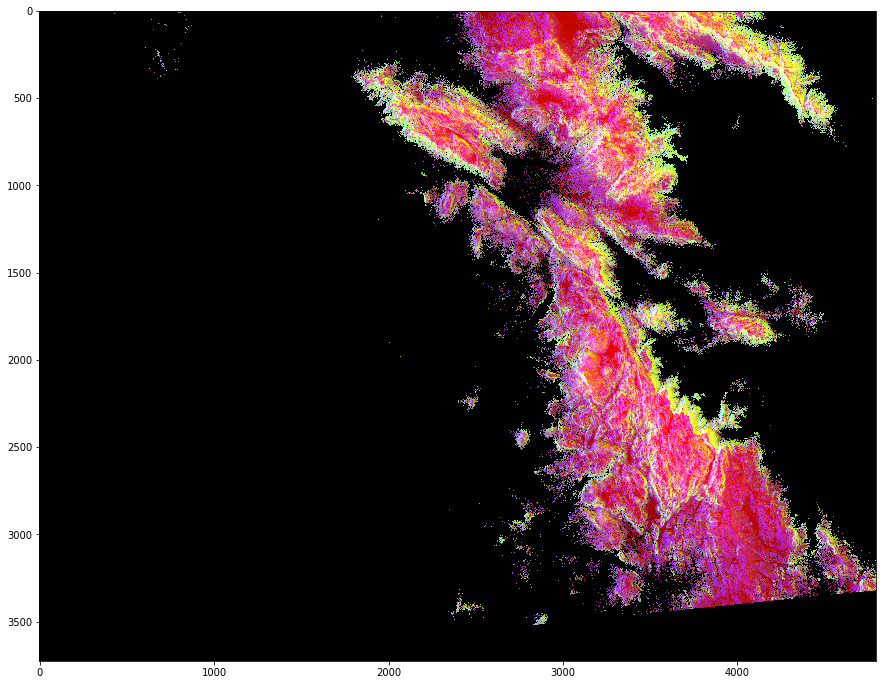

In [40]:
# Masking the red layer
# 0 - Red, 1 - Green, 2 -Blue
# Red defines altitude
photo_data = np.array(imageio.imread('./wifire/sd-3layers.jpg'))
red_mask = photo_data[:, :, 0] < 150
photo_data[red_mask] = 0

plt.figure(figsize=(15, 15))
plt.imshow(photo_data)

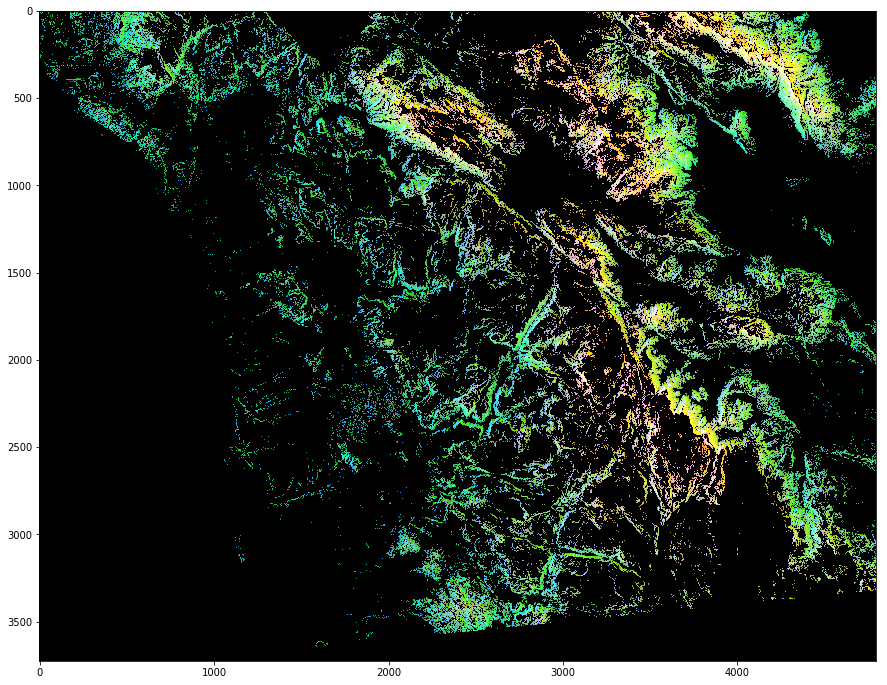

In [41]:
# Masking the red layer
# 0 - Red, 1 - Green, 2 -Blue
# green for aspect
photo_data = np.array(imageio.imread('./wifire/sd-3layers.jpg'))
red_mask = photo_data[:, :, 1] < 150
photo_data[red_mask] = 0

plt.figure(figsize=(15, 15))
plt.imshow(photo_data)

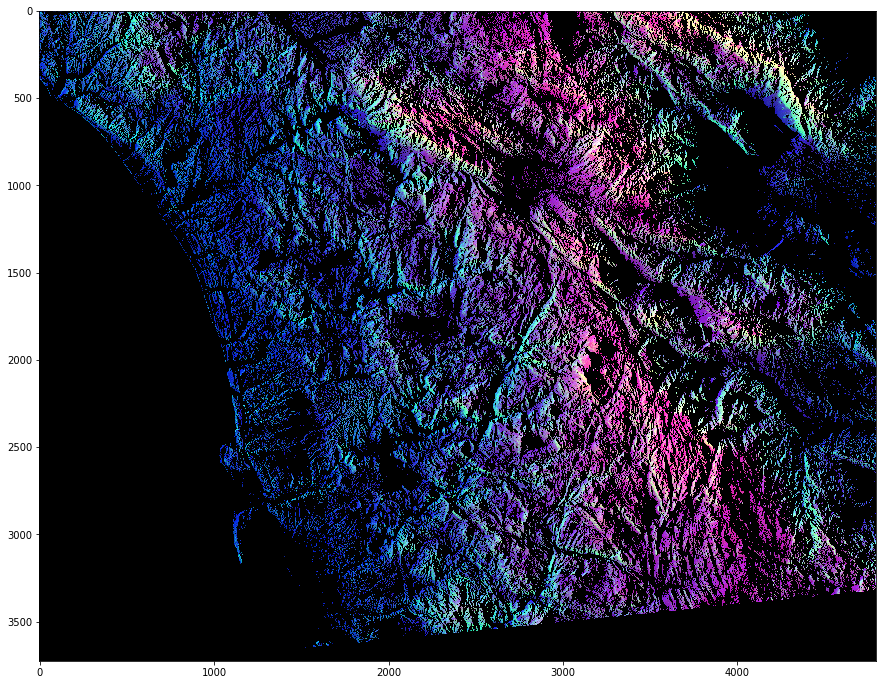

In [42]:
# Masking the red layer
# 0 - Red, 1 - Green, 2 -Blue
# blue for slope
photo_data = np.array(imageio.imread('./wifire/sd-3layers.jpg'))
red_mask = photo_data[:, :, 2] < 150
photo_data[red_mask] = 0

plt.figure(figsize=(15, 15))
plt.imshow(photo_data)

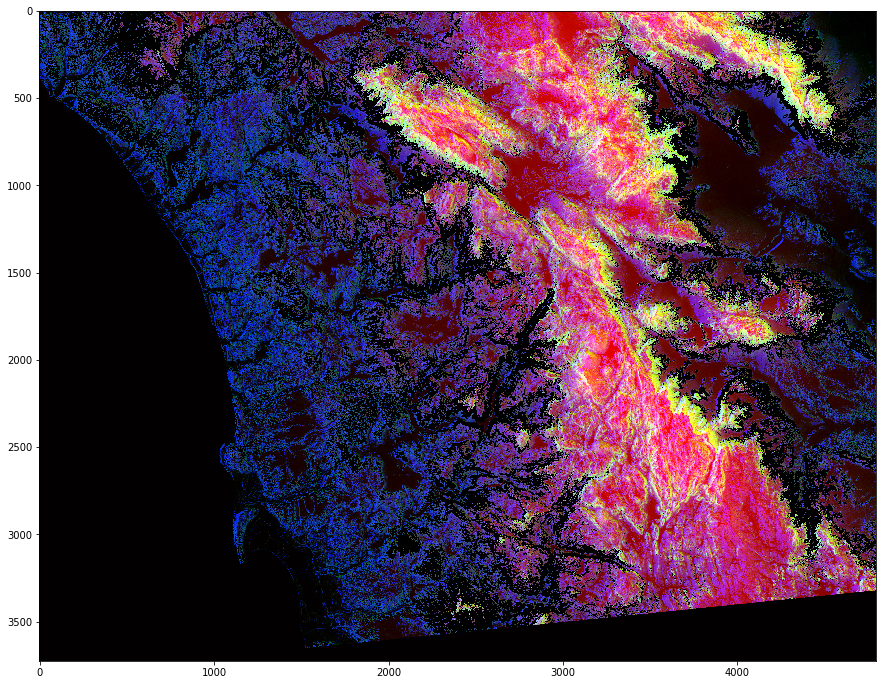

In [43]:
# Masking the red layer
# 0 - Red, 1 - Green, 2 -Blue
# blue for aspect
photo_data = np.array(imageio.imread('./wifire/sd-3layers.jpg'))
red_mask = photo_data[:, :, 0] < 150
green_mask = photo_data[:, :, 1] > 100
blue_mask = photo_data[:, :, 2] < 100

final_mask = np.logical_and(red_mask, green_mask, blue_mask)

photo_data[final_mask] = 0

plt.figure(figsize=(15, 15))
plt.imshow(photo_data)

**ada**